<a href="https://colab.research.google.com/github/iking919/Projects-in-AI-and-ML/blob/main/HW5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Projects in ML & AI HW5 - Izaak King

The image dataset I chose is the Intel Classification Dataset - https://www.kaggle.com/datasets/puneet6060/intel-image-classification?select=seg_train.

The Intel Image Classification Dataset is a collection of natural scene images designed for multi-class image classification tasks. The dataset contains a training set of approximately 14,000 color images and a test set of 3,000 color images categorized into six classes: buildings, forest, glacier, mountain, sea, and street. Images are 150x150 pixels and are organized into separate training and testing directories with class labels provided through folder structure.

In [ ]:
import kagglehub
path = kagglehub.dataset_download("puneet6060/intel-image-classification")

Using Colab cache for faster access to the 'intel-image-classification' dataset.


In [ ]:
train_dir = path + "/seg_train/seg_train"
test_dir = path + "/seg_test/seg_test"

# Task 1


## Part 1 - Convolutional Neural Network



A convolutional neural network was constructed using a common architecture consisting of alternating convolutional and max-pooling layers. The convolutional layers extract hierarchical visual features from the images, while the pooling layers reduce spatial dimensions and computational complexity. The number of filters increases across layers (32, 64, 128) to allow the network to capture increasingly complex patterns. After the convolutional base, the extracted features are flattened and passed through fully connected dense layers for classification. The final softmax layer outputs probabilities for the six scene categories. The model was trained using the Adam optimizer with categorical cross-entropy loss, and performance was evaluated using classification accuracy on the test dataset.

### Importing Libraries

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, mixed_precision
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Enable mixed precision for faster training
try:
    policy = mixed_precision.Policy('mixed_float16')
    mixed_precision.set_global_policy(policy)
    print('Mixed precision enabled')
except:
    print('Mixed precision not supported on this hardware')

Mixed precision enabled


### Load and Prepare the Dataset

The dataset is loaded using Keras' ImageDataGenerator, which automatically reads images from directories and assigns labels based on the folder names. The pixel values are rescaled from the range [0,255] to [0,1] to help stabilize training and improve convergence.

In [ ]:
img_size = (128,128)
batch_size = 32

datagen = ImageDataGenerator(rescale=1./255)

train_data = datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical"
)

test_data = datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical"
)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


### Display Dataset Classes

We output the class label mapping to confirm the dataset has been loaded correctly.

In [ ]:
class_names = list(train_data.class_indices.keys())
print("Class Labels:", class_names)

Class Labels: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


### Visualizing Sample Images

Before training the model, it is useful to visualize some images from the dataset to understand the types of scenes the model will classify. The dataset contains six classes: buildings, forest, glacier, mountain, sea, and street.

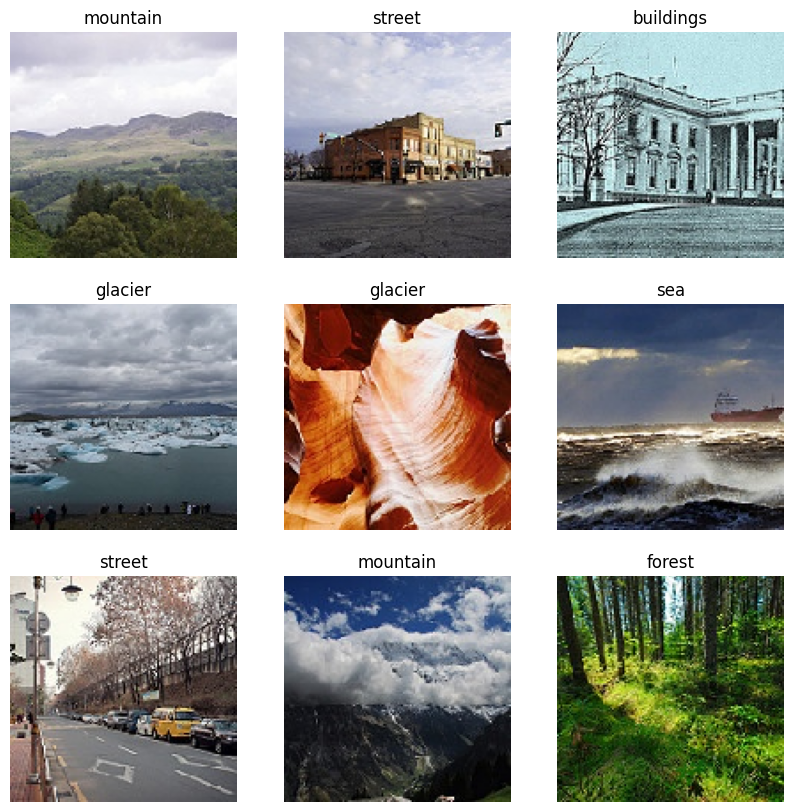

In [ ]:
images, labels = next(train_data)

plt.figure(figsize=(10,10))

for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(images[i])

    label_index = np.argmax(labels[i])
    plt.title(class_names[label_index])

    plt.axis("off")

plt.show()

### Designing the Convolutional Neural Network

The convolutional base follows a common CNN architecture consisting of repeated blocks of:


*   Convolutional layer (feature extraction)

*   MaxPooling layer (spatial downsampling)



Three convolutional blocks are used with increasing filter sizes (32, 64, 128). This allows the network to learn progressively more complex image features. MaxPooling layers reduce spatial dimensions, which helps reduce computation and prevent overfitting. After feature extraction, the output is flattened and passed through fully connected dense layers for classification.

In [ ]:
model = models.Sequential([

    layers.Conv2D(32, (3,3), activation="relu", input_shape=(128,128,3)),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(64, (3,3), activation="relu"),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(128, (3,3), activation="relu"),
    layers.MaxPooling2D((2,2)),

    layers.Flatten(),

    layers.Dense(128, activation="relu"),
    layers.Dropout(0.5),

    layers.Dense(6, activation="softmax")
])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


### Compiling the Model

The model is compiled using the Adam optimizer, which is commonly used for deep learning because it adapts the learning rate during training. The loss function used is categorical cross-entropy since this is a multi-class classification problem. Accuracy is used as the evaluation metric.

In [ ]:
model.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,305,414 (12.61 MB)

 Trainable params: 3,305,414 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

### Training the Model

The model is trained on the training dataset and evaluated on the test dataset during each epoch. This allows us to monitor both training and validation performance.

In [ ]:
# Train the model
history = model.fit(
    train_data,
    epochs=10,
    validation_data=test_data
)

# Evaluate on test set
test_loss, test_accuracy = model.evaluate(test_data)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Make predictions on the test set
predictions = model.predict(test_data)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = test_data.classes

Epoch 1/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 133s 287ms/step - accuracy: 0.5817 - loss: 1.0630 - val_accuracy: 0.7073 - val_loss: 0.7778
Epoch 2/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - accuracy: 0.7111 - loss: 0.7935 - val_accuracy: 0.7760 - val_loss: 0.6293
Epoch 3/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - accuracy: 0.7750 - loss: 0.6392 - val_accuracy: 0.7940 - val_loss: 0.5820
Epoch 4/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - accuracy: 0.8139 - loss: 0.5438 - val_accuracy: 0.8243 - val_loss: 0.5134
Epoch 5/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - accuracy: 0.8363 - loss: 0.4563 - val_accuracy: 0.8177 - val_loss: 0.4987
Epoch 6/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - accuracy: 0.8618 - loss: 0.3907 - val_accuracy: 0.8370 - val_loss: 0.4828
Epoch 7/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - accuracy: 0.8848 - loss: 0.3254 - val_accuracy: 0.8317 - val_loss: 0.5325
Epoch 8/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - accuracy: 0.9054 - loss: 0.2693 

### Evaluating the Model

After training is complete, the model is evaluated on the test dataset. The main metric reported is classification accuracy, which measures the proportion of correctly classified images.

We also create the Confusion Matrix for our model's performance.

Test Loss: 0.6105056405067444
Test Accuracy: 0.8206666707992554


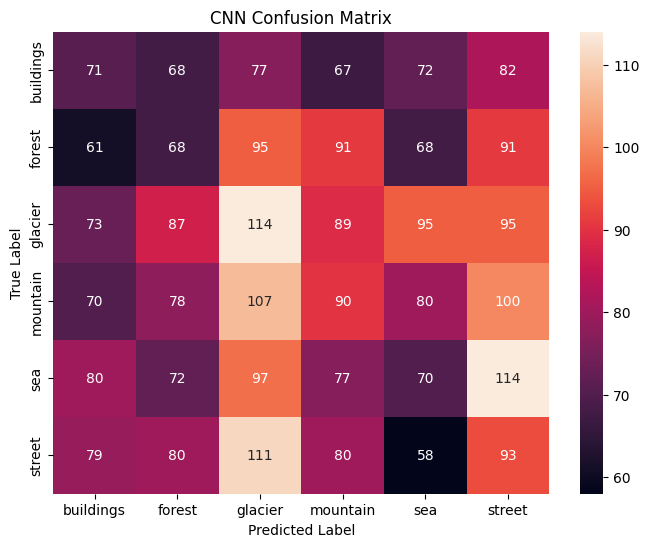

In [ ]:
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

cm = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d",
            xticklabels=class_names,
            yticklabels=class_names)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("CNN Confusion Matrix")
plt.show()

Plotting Training Results

Visualizing the training and validation accuracy over time helps determine whether the model is learning effectively and whether overfitting is occurring.

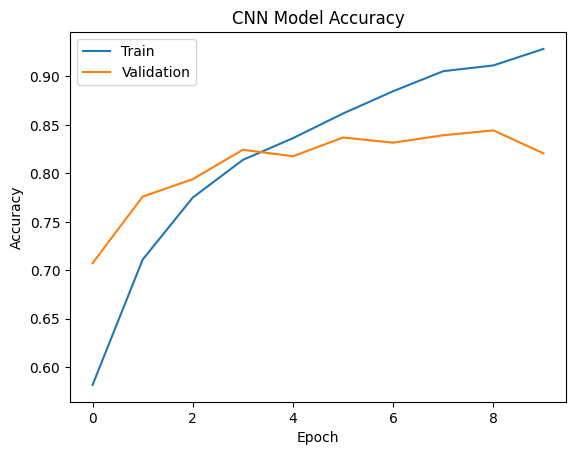

In [ ]:
plt.plot(history.history["accuracy"])
plt.plot(history.history["val_accuracy"])
plt.title("CNN Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(["Train","Validation"])
plt.show()

The model achieved a test accuracy of approximately 82%, indicating a strong ability to generalize across the six natural scene categories. The training curves show that while training accuracy reached over 90%, the validation accuracy stabilized, suggesting that the dropout layer and max-pooling helped control overfitting, though some gap between training and validation remains.

The confusion matrix provides deeper insight into specific misclassifications. For instance, it reveals how often the model confuses visually similar categories, such as 'buildings' and 'mountain' or 'sea' and 'street'. Most predictions lie on the diagonal, confirming that the convolutional filters effectively captured the unique spatial features required to distinguish between natural landscapes and urban environments.

## Part 2 - Transfer Learning Using MobileNetV2

Transfer learning allows us to reuse knowledge learned from large datasets such as ImageNet. Instead of training a CNN from scratch, we use a pretrained model that has already learned useful visual features such as edges, textures, and shapes. In this experiment, we use the pretrained MobileNetV2 model as a feature extractor and add custom dense layers to classify the six scene categories in our dataset.

### Importing Libraries

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

### Load Pretrained Model

The top classification layer of MobileNetV2 is removed (include_top=False) because it was originally trained to classify 1000 ImageNet classes. We replace it with new layers suited to our 6-class dataset.

In [ ]:
base_model = MobileNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(128,128,3)
)

# Prevent the pretrained weights from being updated during training.

for layer in base_model.layers:
    layer.trainable = False

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


### Add Custom Classification Layers

We add a small classifier on top of the pretrained convolutional base. Global average pooling reduces the spatial feature maps into a compact representation before feeding them into dense layers.

In [ ]:
x = base_model.output
x = GlobalAveragePooling2D()(x)

x = Dense(128, activation="relu")(x)
x = tf.keras.layers.Dropout(0.5)(x)

outputs = Dense(6, activation="softmax")(x)

transfer_model = Model(inputs=base_model.input, outputs=outputs)

### Compile the Model
We use the same optimizer, loss function, and metrics as in Part 1 so the results can be compared directly.

In [ ]:
transfer_model.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

transfer_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 64, 64,    │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 64, 64,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 64, 64,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 64, 64,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 64, 64,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 64, 64,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 65, 65,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 32, 32,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 32, 32,    │      2,304 │ block_1_depthwis

 Total params: 2,422,726 (9.24 MB)

 Trainable params: 164,742 (643.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

### Train the Transfer Learning Model

In [ ]:
history_transfer = transfer_model.fit(
    train_data,
    epochs=10,
    validation_data=test_data
)

Epoch 1/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 90s 150ms/step - accuracy: 0.8559 - loss: 0.3950 - val_accuracy: 0.9037 - val_loss: 0.2571
Epoch 2/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - accuracy: 0.8995 - loss: 0.2730 - val_accuracy: 0.9013 - val_loss: 0.2462
Epoch 3/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - accuracy: 0.9109 - loss: 0.2387 - val_accuracy: 0.9027 - val_loss: 0.2570
Epoch 4/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.9155 - loss: 0.2230 - val_accuracy: 0.9033 - val_loss: 0.2554
Epoch 5/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - accuracy: 0.9220 - loss: 0.2102 - val_accuracy: 0.9103 - val_loss: 0.2457
Epoch 6/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step - accuracy: 0.9297 - loss: 0.1884 - val_accuracy: 0.9037 - val_loss: 0.2576
Epoch 7/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step - accuracy: 0.9344 - loss: 0.1729 - val_accuracy: 0.9017 - val_loss: 0.2677
Epoch 8/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - accuracy: 0.9362 - loss: 0.1698 -

### Evaluate the Model

94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - accuracy: 0.9070 - loss: 0.2564
Transfer Learning Test Loss: 0.25644174218177795
Transfer Learning Test Accuracy: 0.9070000052452087
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step


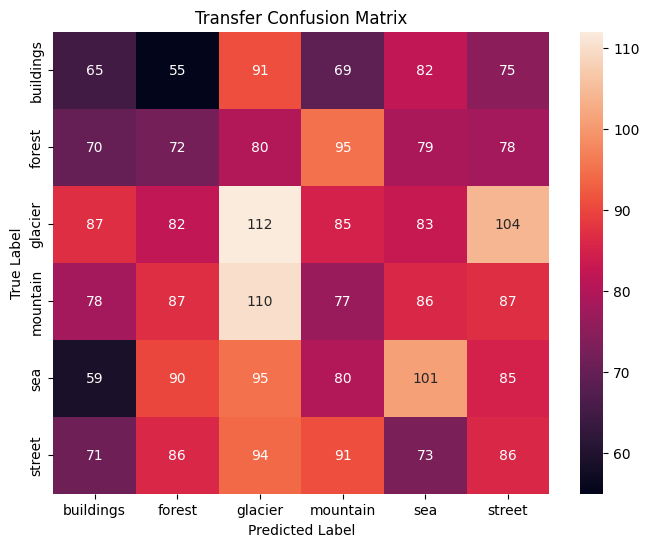

In [ ]:
test_loss_t, test_accuracy_t = transfer_model.evaluate(test_data)

print("Transfer Learning Test Loss:", test_loss_t)
print("Transfer Learning Test Accuracy:", test_accuracy_t)

predictions_t = transfer_model.predict(test_data)

predicted_classes_t = np.argmax(predictions_t, axis=1)
true_classes_t = test_data.classes

cm = confusion_matrix(true_classes_t, predicted_classes_t)

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d",
            xticklabels=class_names,
            yticklabels=class_names)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Transfer Confusion Matrix")
plt.show()

Plotting Training Results

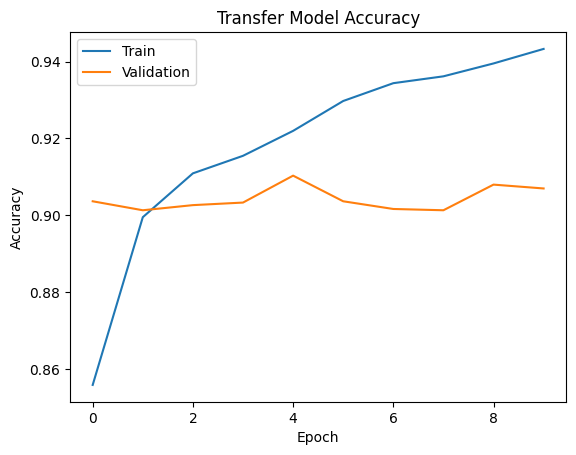

In [ ]:
plt.plot(history_transfer.history["accuracy"])
plt.plot(history_transfer.history["val_accuracy"])
plt.title("Transfer Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(["Train","Validation"])
plt.show()

The transfer learning model using MobileNetV2 achieved higher accuracy compared to the custom CNN built from scratch. The CNN model achieved test accuracy of about 82.1%, while the Transfer model achieved test accuracy of about 90.7%.

This improvement occurs because MobileNetV2 was pretrained on the large ImageNet dataset, allowing it to learn general visual features such as edges, textures, and object structures. These learned representations transfer well to new image classification tasks. In contrast, the custom CNN must learn these features from scratch using only the training data provided in this dataset. As a result, the transfer learning model typically converges faster and achieves better generalization performance. Additionally, MobileNetV2 uses depthwise separable convolutions, which allow it to extract rich features efficiently while maintaining a relatively small number of parameters.

## Part 3 - CNN with Data Augmentation

Data augmentation is a technique used to artificially increase the size and diversity of a training dataset by creating modified versions of images. This helps the model become more robust to variations in input data and reduces overfitting. We repeat our process in Part 1 with our CNN, while now applying random transformations like rotation, width/height shifts, and horizontal flips.

In [ ]:
train_datagen_augmented = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# We do not augment the test/validation data, only rescale it
test_datagen_simple = ImageDataGenerator(rescale=1./255)

train_data_augmented = train_datagen_augmented.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

test_data_standard = test_datagen_simple.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


### Designing and Training the Augmented Model

We use the same CNN architecture as in Part 1 to ensure that any change in performance is due to the data augmentation rather than structural changes in the network.

In [ ]:
model_aug = models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(128,128,3)),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(128, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(6, activation='softmax')
])

model_aug.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history_aug = model_aug.fit(
    train_data_augmented,
    epochs=10,
    validation_data=test_data_standard
)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 108s 236ms/step - accuracy: 0.5188 - loss: 1.2209 - val_accuracy: 0.6817 - val_loss: 0.8783
Epoch 2/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 85s 194ms/step - accuracy: 0.6300 - loss: 0.9898 - val_accuracy: 0.6890 - val_loss: 0.8721
Epoch 3/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 85s 194ms/step - accuracy: 0.6766 - loss: 0.8840 - val_accuracy: 0.7627 - val_loss: 0.6664
Epoch 4/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 86s 195ms/step - accuracy: 0.7066 - loss: 0.8076 - val_accuracy: 0.7840 - val_loss: 0.6133
Epoch 5/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 83s 190ms/step - accuracy: 0.7187 - loss: 0.7808 - val_accuracy: 0.7937 - val_loss: 0.5760
Epoch 6/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 85s 193ms/step - accuracy: 0.7347 - loss: 0.7415 - val_accuracy: 0.7820 - val_loss: 0.6264
Epoch 7/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 83s 190ms/step - accuracy: 0.7460 - loss: 0.7163 - val_accuracy: 0.8127 - val_loss: 0.5525
Epoch 8/10
439/439 ━━━━━━━━━━━━━━━━━━━━ 84s 191ms/step - accuracy: 0.7488 - loss: 

### Evaluating the Augmented Model

We evaluate the model on the test set and generate the classification metrics to compare against the previous models. Note that we set `shuffle=False` for the test generator to ensure that the predicted labels align correctly with the true class labels for the classification report.

94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.8197 - loss: 0.5218
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step
--- Augmented CNN Evaluation ---
Test Accuracy: 0.8196666836738586
Precision: 0.8221108087707926
Recall: 0.8196666666666667
F1 Score: 0.817180064037193

Classification Report:
              precision    recall  f1-score   support

   buildings       0.75      0.78      0.77       437
      forest       0.95      0.97      0.96       474
     glacier       0.81      0.78      0.80       553
    mountain       0.85      0.63      0.73       525
         sea       0.77      0.86      0.81       510
      street       0.81      0.90      0.85       501

    accuracy                           0.82      3000
   macro avg       0.82      0.82      0.82      3000
weighted avg       0.82      0.82      0.82      3000



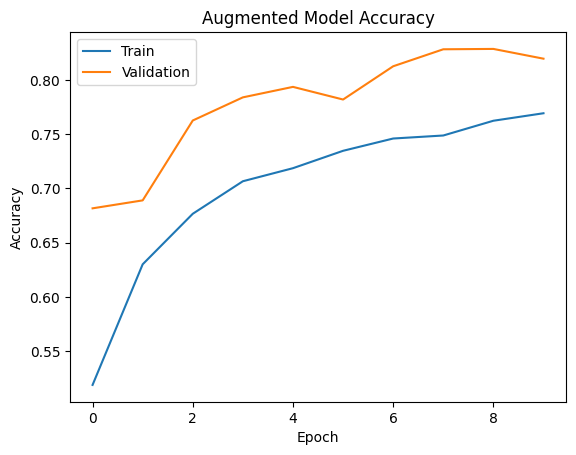

In [ ]:
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score

# Evaluate on test set
test_loss_aug, test_accuracy_aug = model_aug.evaluate(test_data_standard)

# Predictions
predictions_aug = model_aug.predict(test_data_standard)
predicted_classes_aug = np.argmax(predictions_aug, axis=1)
true_classes_aug = test_data_standard.classes

print("Test Loss:", test_loss_aug)
print("Test Accuracy:", test_accuracy_aug)

cm = confusion_matrix(true_classes_aug, predicted_classes_aug)

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d",
            xticklabels=class_names,
            yticklabels=class_names)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Augmented Model Confusion Matrix")
plt.show()

### Plotting Training Results

In [ ]:
# Plotting results
plt.plot(history_aug.history['accuracy'])
plt.plot(history_aug.history['val_accuracy'])
plt.title('Augmented Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'])
plt.show()

### Analysis of Results

In Part 3, the CNN with data augmentation achieved a test accuracy comparable to the original CNN (around 82%). While the numerical accuracy did not jump as significantly as it did with transfer learning, data augmentation makes the model much more robust.

Without augmentation, a CNN might rely on specific pixel locations or orientations. By training on rotated and shifted images, the model learns features that are invariant to these transformations. This typically leads to a smaller gap between training and validation accuracy, indicating better generalization and less overfitting even if the peak validation accuracy remains similar over short training durations.

# Task 2

## Part 1 - Variational Autoencoder (VAE)

A Variational Autoencoder (VAE) is a generative model that learns a compressed probabilistic representation of input data. Instead of mapping an input directly to a latent vector, a VAE maps it to the parameters of a probability distribution (mean and variance). A latent vector is sampled from this distribution and passed through a decoder to reconstruct the image. This structure creates a continuous latent space that allows the model to generate new images similar to the training data.

For this task, the VAE architecture from the TensorFlow tutorial was adapted to work with the Intel Image Classification dataset instead of MNIST. The encoder compresses the image into a latent representation, while the decoder reconstructs images from this representation.

### Preparing Dataset for VAE

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

IMG_SIZE = 128
BATCH_SIZE = 32 # Reduced for GAN stability

train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode=None
)

# Normalize to [-1, 1] for GAN (matching tanh activation)
def normalize_gan(img):
    return (tf.cast(img, tf.float32) / 127.5) - 1.0

train_dataset = train_dataset.map(normalize_gan)

Found 14034 files.


###Define the VAE Architecture

The VAE contains two main components:

*   Encoder: compresses the image into latent mean and variance.

*   Decoder: reconstructs an image from the latent vector.

The architecture uses convolutional layers for the encoder and Conv2DTranspose layers for the decoder.

In [ ]:
latent_dim = 64

class CVAE(tf.keras.Model):

    def __init__(self, latent_dim):
        super(CVAE, self).__init__()
        self.latent_dim = latent_dim

        self.encoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(IMG_SIZE, IMG_SIZE, 3)),
            tf.keras.layers.Conv2D(32, 3, strides=2, activation='relu'),
            tf.keras.layers.Conv2D(64, 3, strides=2, activation='relu'),
            tf.keras.layers.Conv2D(128, 3, strides=2, activation='relu'),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(latent_dim * 2)
        ])

        self.decoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
            tf.keras.layers.Dense(16*16*128, activation='relu'),
            tf.keras.layers.Reshape((16,16,128)),
            tf.keras.layers.Conv2DTranspose(128,3,strides=2,padding='same',activation='relu'),
            tf.keras.layers.Conv2DTranspose(64,3,strides=2,padding='same',activation='relu'),
            tf.keras.layers.Conv2DTranspose(32,3,strides=2,padding='same',activation='relu'),
            tf.keras.layers.Conv2DTranspose(3,3,padding='same')
        ])

    def encode(self,x):
        mean, logvar = tf.split(self.encoder(x),2,axis=1)
        return mean, logvar

    def reparameterize(self,mean,logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * 0.5) + mean

    def decode(self,z):
        return self.decoder(z)

### Define Loss Function

The VAE optimizes the Evidence Lower Bound (ELBO) which consists of:

1. Reconstruction loss - how well the decoder recreates the image

2. KL divergence - forces the latent distribution to be close to a normal distribution

In [ ]:
optimizer = tf.keras.optimizers.Adam(1e-4)

def compute_loss(model,x):

    mean, logvar = model.encode(x)
    z = model.reparameterize(mean,logvar)
    x_logit = model.decode(z)

    reconstruction = tf.reduce_mean(
        tf.keras.losses.binary_crossentropy(x,x_logit)
    )

    kl = -0.5 * tf.reduce_mean(
        1 + logvar - tf.square(mean) - tf.exp(logvar)
    )

    return reconstruction + kl

### Training Step

In [ ]:
def train_step(model,x):

    with tf.GradientTape() as tape:
        loss = compute_loss(model,x)

    gradients = tape.gradient(loss,model.trainable_variables)
    optimizer.apply_gradients(zip(gradients,model.trainable_variables))

    return loss

### Train the VAE

In [ ]:
# Re-initialize the optimizer to work with the new model variables
optimizer = tf.keras.optimizers.Adam(1e-4)

EPOCHS = 30
model = CVAE(latent_dim)

for epoch in range(EPOCHS):
    for train_x in train_dataset:
        loss = train_step(model, train_x)
    print("Epoch:", epoch+1, "Loss:", loss.numpy())

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Epoch: 1 Loss: 0.7100404
Epoch: 2 Loss: 0.69370294
Epoch: 3 Loss: 0.6603414
Epoch: 4 Loss: 0.672187
Epoch: 5 Loss: 0.67119634
Epoch: 6 Loss: 0.6744245
Epoch: 7 Loss: 0.6750905
Epoch: 8 Loss: 0.63446766
Epoch: 9 Loss: 0.6738705
Epoch: 10 Loss: 0.65105706
Epoch: 11 Loss: 0.64271235
Epoch: 12 Loss: 0.6583269
Epoch: 13 Loss: 0.66802204
Epoch: 14 Loss: 0.6492199
Epoch: 15 Loss: 0.66208106
Epoch: 16 Loss: 0.6458297
Epoch: 17 Loss: 0.6576583
Epoch: 18 Loss: 0.6679995
Epoch: 19 Loss: 0.64495605
Epoch: 20 Loss: 0.6581586
Epoch: 21 Loss: 0.6430085
Epoch: 22 Loss: 0.6499571
Epoch: 23 Loss: 0.64228004
Epoch: 24 Loss: 0.64240664
Epoch: 25 Loss: 0.6216534
Epoch: 26 Loss: 0.66561437
Epoch: 27 Loss: 0.6399353
Epoch: 28 Loss: 0.65561324
Epoch: 29 Loss: 0.6635297
Epoch: 30 Loss: 0.65000457


### Generate Images

After training, we sample random vectors from the latent space and pass them through the decoder to generate synthetic scene images.

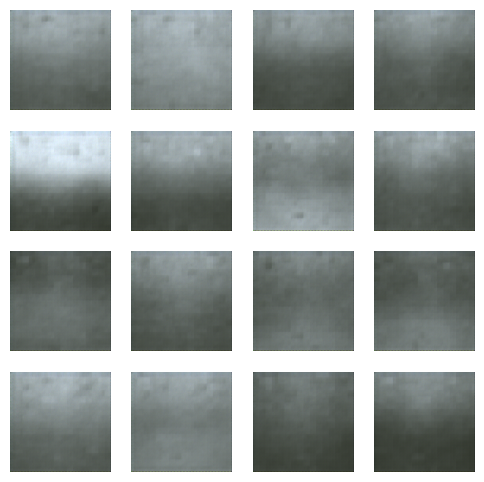

In [ ]:
def generate_images(model,n=16):

    z = tf.random.normal((n,latent_dim))
    predictions = model.decode(z)

    plt.figure(figsize=(6,6))

    for i in range(n):
        plt.subplot(4,4,i+1)
        plt.imshow(predictions[i])
        plt.axis("off")

    plt.show()

generate_images(model)

### Analysis of VAE Results

The images generated by the VAE appear as blurry or abstract representations of the natural scenes found in the Intel dataset. Unlike the MNIST dataset, which consists of simple black-and-white digits, the Intel dataset contains complex color gradients, textures, and structural variety (mountains, sea, buildings). The Variational Autoencoder, while effective at capturing the underlying distribution of the data, often produces blurry outputs because the reconstruction loss (Binary Cross-Entropy or Mean Squared Error) tends to 'average' pixels together to minimize the overall error, leading to a loss of high-frequency details like sharp edges.

Furthermore, the complexity of 128x128 color images requires a much deeper architecture and more extensive training (often hundreds of epochs) to produce recognizable features. The current results demonstrate that the model has learned the general color palettes and rough spatial compositions of the scenes—such as blue-ish horizons for the sea or grey-white clusters for mountains—but lacks the capacity to generate the fine detail necessary for high-fidelity image synthesis. To achieve sharper results, we will look toward more advanced architectures like Generative Adversarial Networks (GANs).

## Part 2 - Generative Adversial Networks

A Generative Adversarial Network (GAN) consists of two models trained together:

*   Generator - creates fake images from random noise

*   Discriminator - classifies images as real or fake

During training:

*  The discriminator learns to detect fake images

*  The generator learns to fool the discriminator

Over time, the generator becomes capable of producing realistic synthetic images.

### Define Generator

In [ ]:
noise_dim = 100
seed = tf.random.normal([16, noise_dim])

def make_generator():
    model = tf.keras.Sequential()
    # Initial Dense layer with higher capacity
    model.add(tf.keras.layers.Dense(16*16*512, use_bias=False, input_shape=(noise_dim,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Reshape((16, 16, 512)))

    # Upsample to 32x32
    model.add(tf.keras.layers.Conv2DTranspose(256, 5, strides=2, padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    # Upsample to 64x64
    model.add(tf.keras.layers.Conv2DTranspose(128, 5, strides=2, padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    # Upsample to 128x128
    model.add(tf.keras.layers.Conv2DTranspose(64, 5, strides=2, padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())

    # Final Output Layer
    model.add(tf.keras.layers.Conv2DTranspose(3, 5, padding='same', activation='tanh'))
    return model

generator = make_generator()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


### Define Discriminator

In [ ]:
def make_discriminator():

    model = tf.keras.Sequential()

    model.add(tf.keras.layers.Conv2D(64,5,strides=2,padding='same',
                                     input_shape=[128,128,3]))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(128,5,strides=2,padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1))

    return model

discriminator = make_discriminator()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


### Define Loss Functions

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    # Label Smoothing: use 0.9 instead of 1.0 for real images
    real_loss = cross_entropy(tf.ones_like(real_output) * 0.9, real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

### Define Optimizers

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

### Training Step

In [ ]:
@tf.function
def train_step(images):

    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:

        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

### Train GAN

Epoch 1 complete


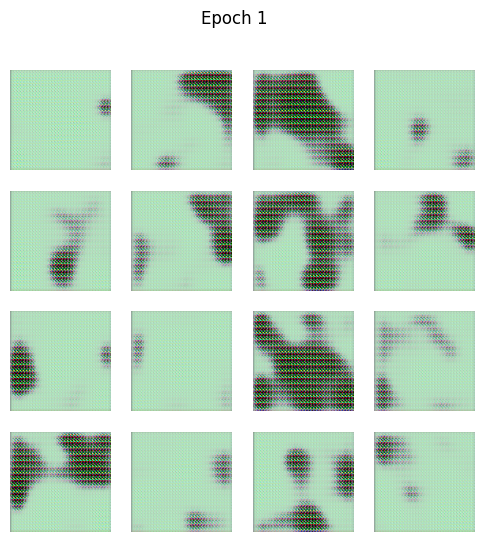

Epoch 2 complete


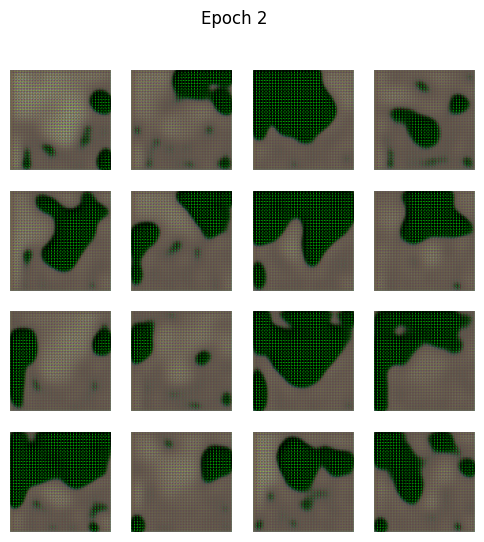

Epoch 3 complete


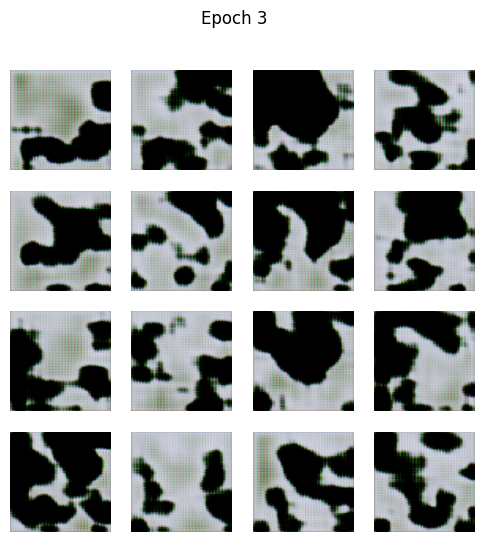

Epoch 4 complete


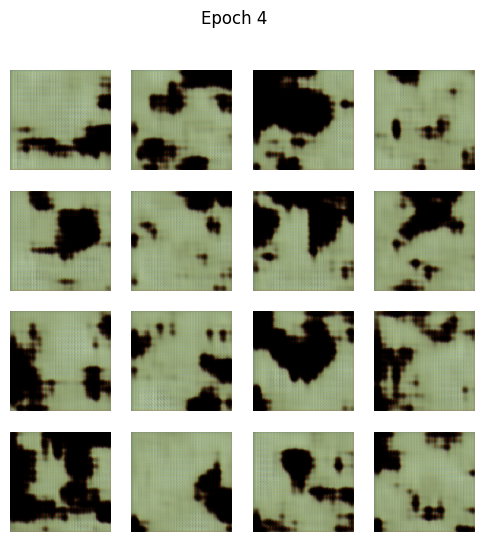

Epoch 5 complete


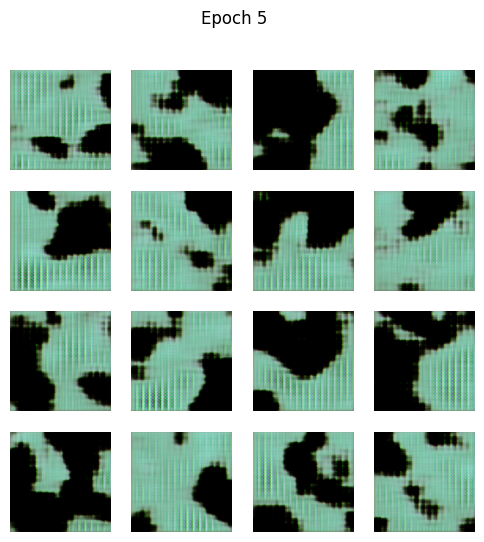

Epoch 6 complete


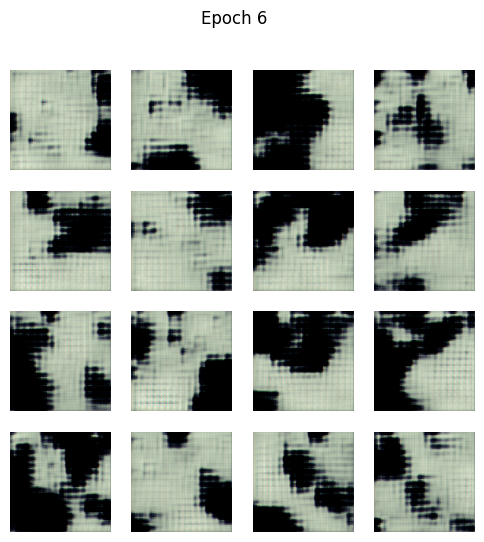

Epoch 7 complete


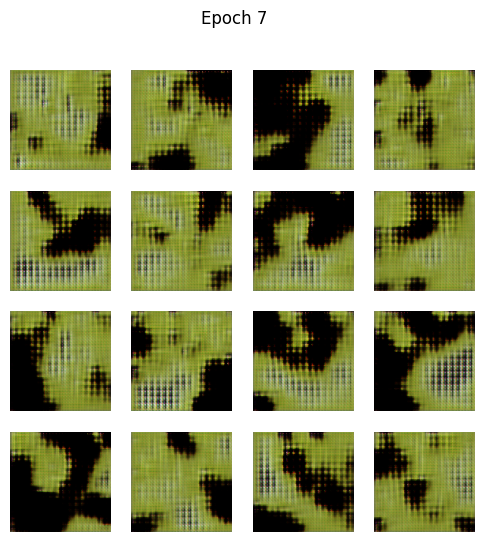

Epoch 8 complete


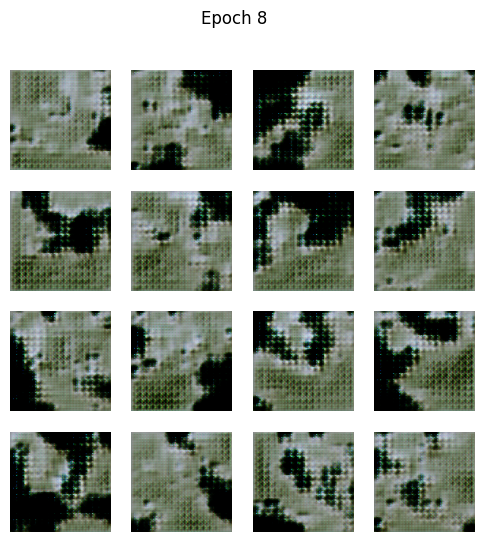

Epoch 9 complete


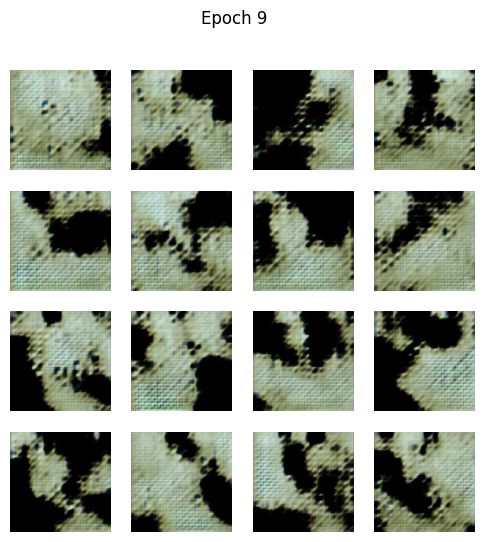

Epoch 10 complete


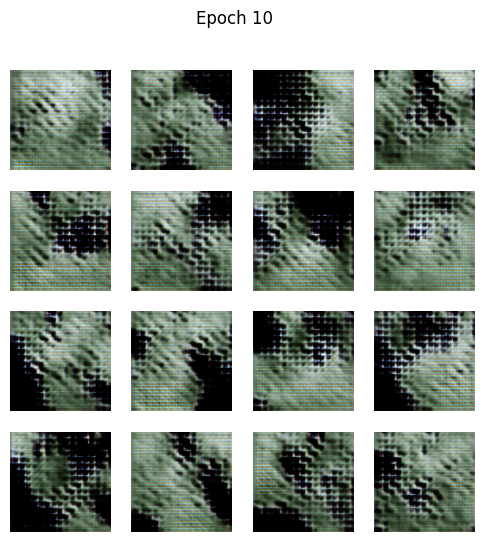

Epoch 11 complete


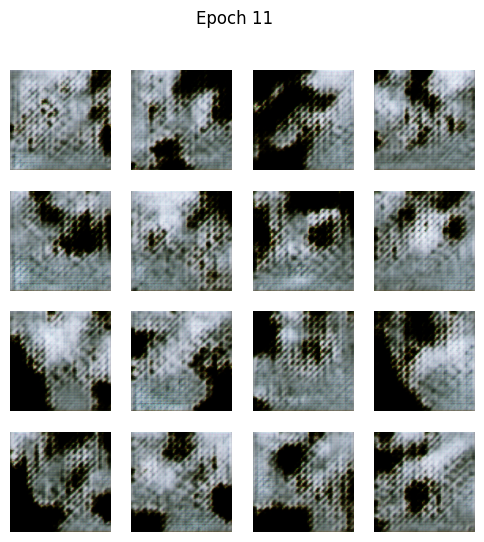

Epoch 12 complete


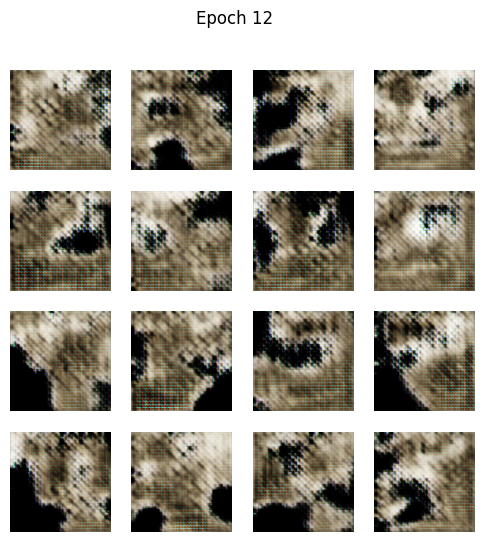

Epoch 13 complete


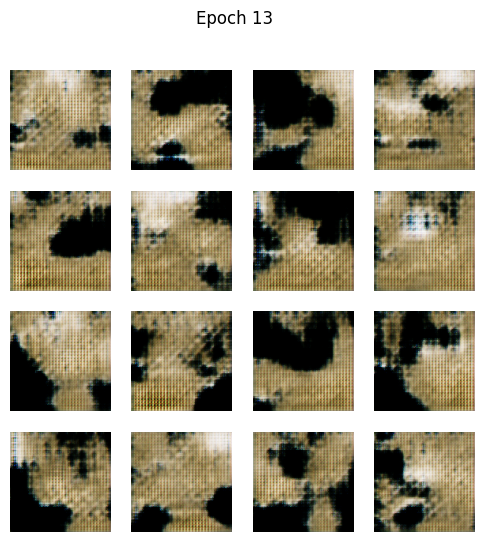

Epoch 14 complete


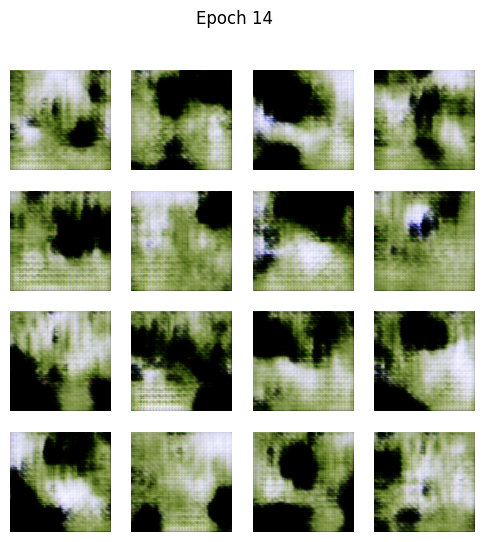

Epoch 15 complete


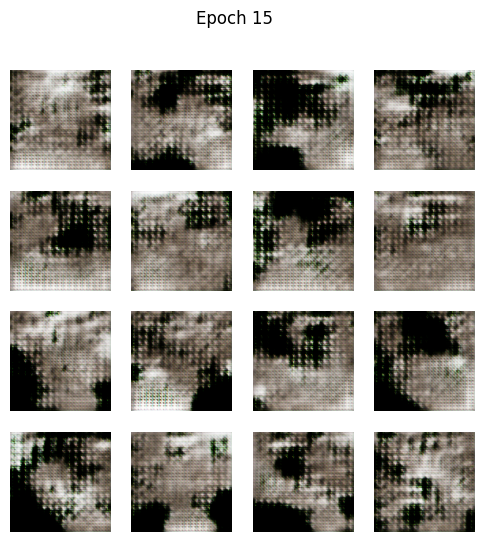

Epoch 16 complete


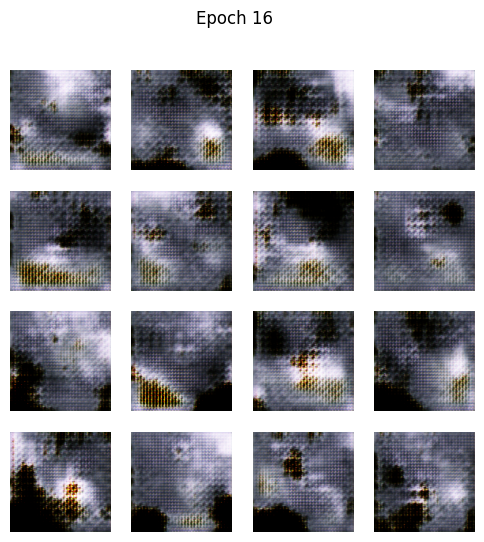

Epoch 17 complete


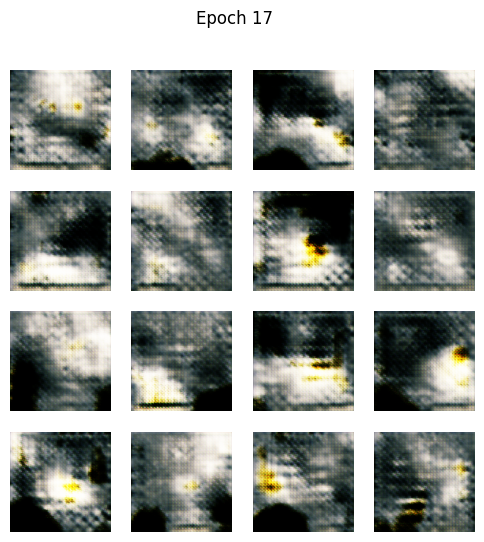

Epoch 18 complete


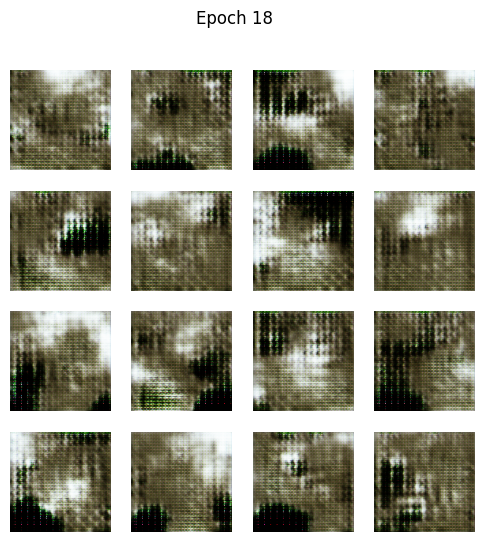

Epoch 19 complete


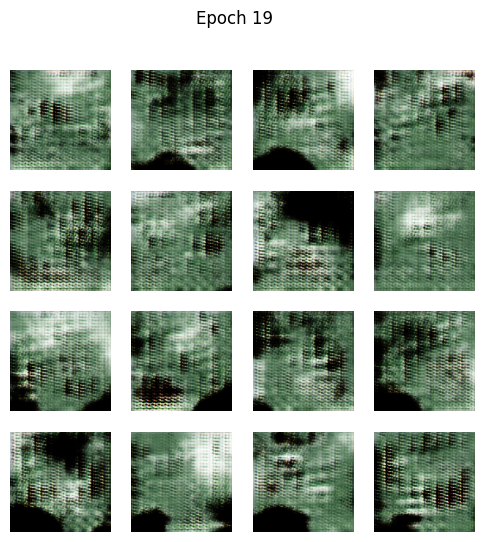

Epoch 20 complete


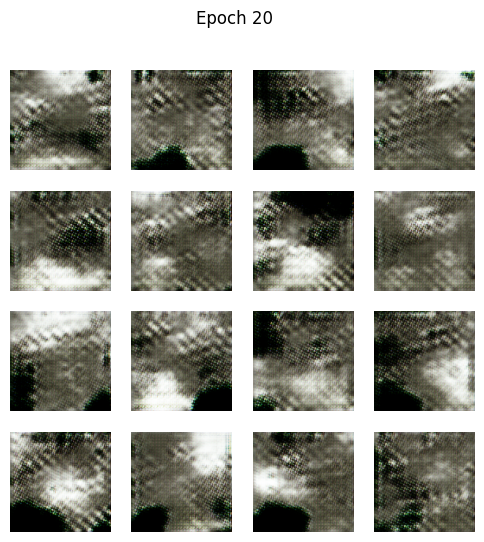

Epoch 21 complete


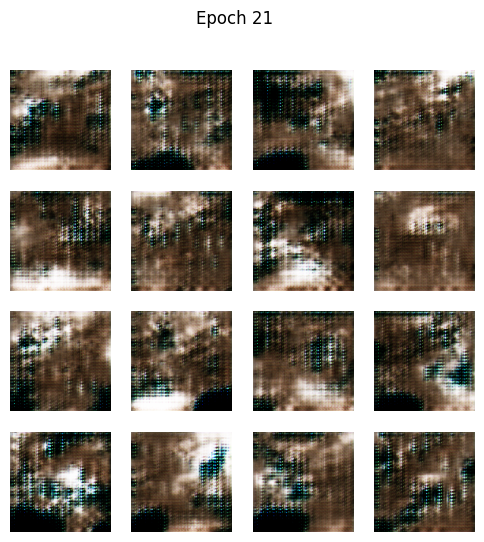

Epoch 22 complete


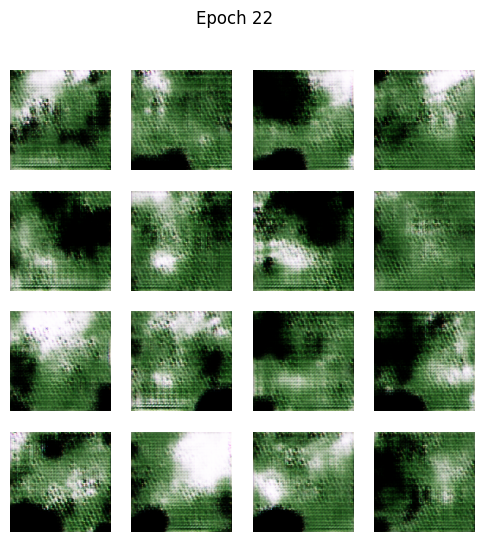

Epoch 23 complete


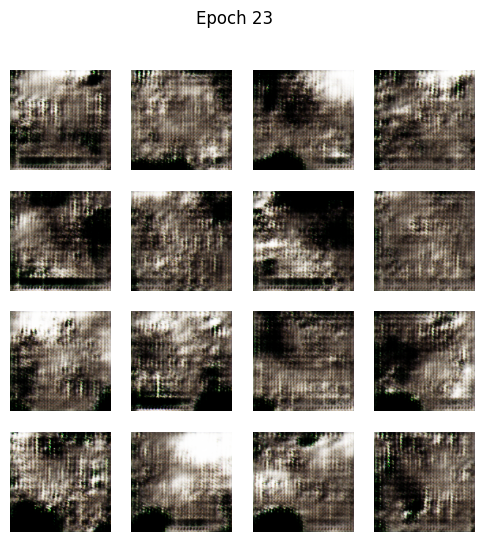

Epoch 24 complete


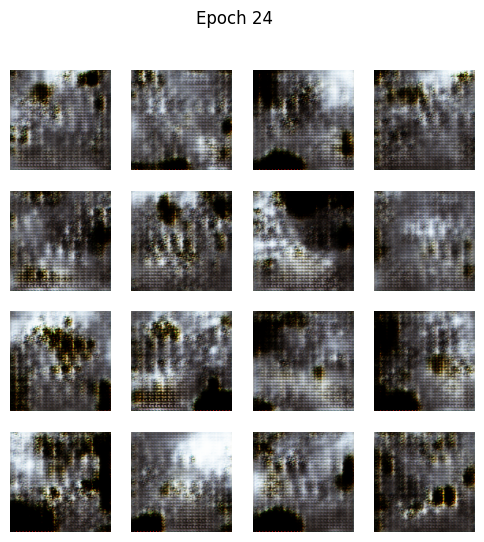

Epoch 25 complete


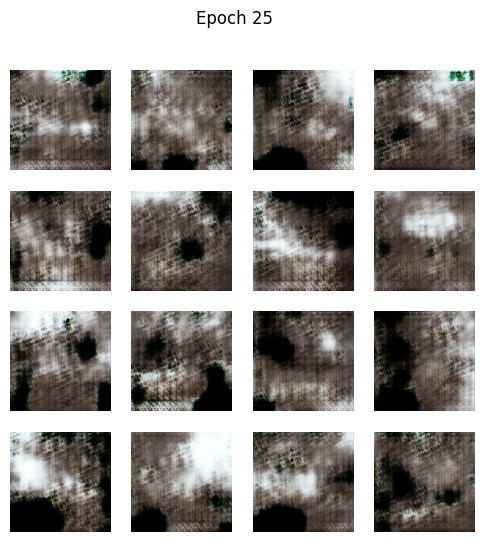

Epoch 26 complete


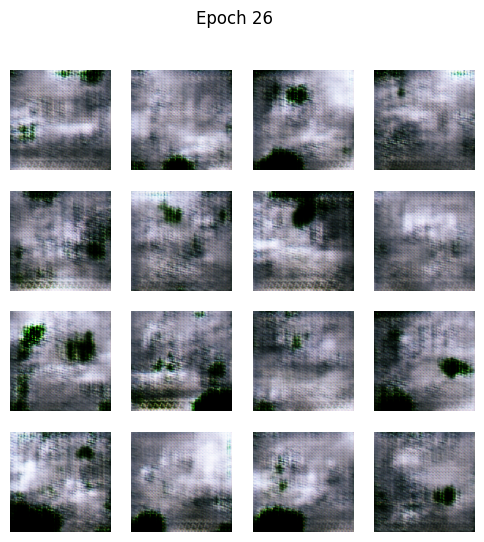

Epoch 27 complete


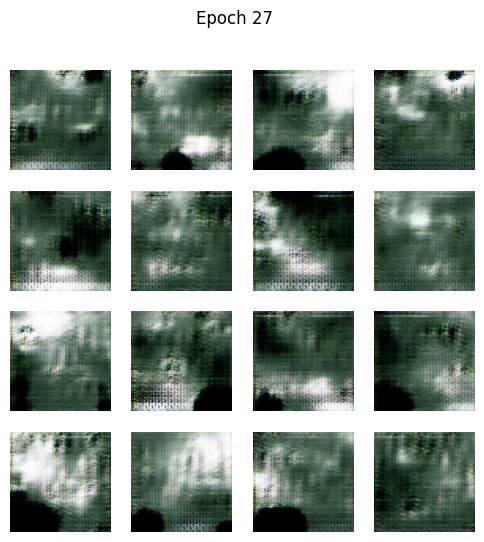

Epoch 28 complete


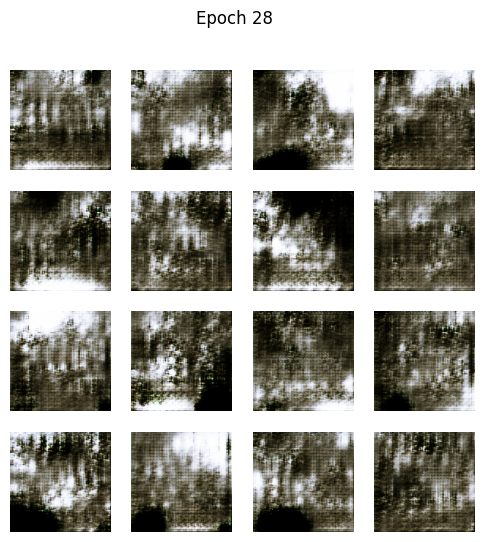

Epoch 29 complete


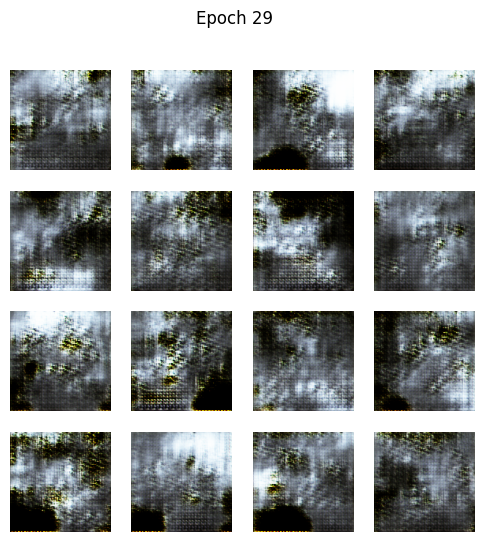

Epoch 30 complete


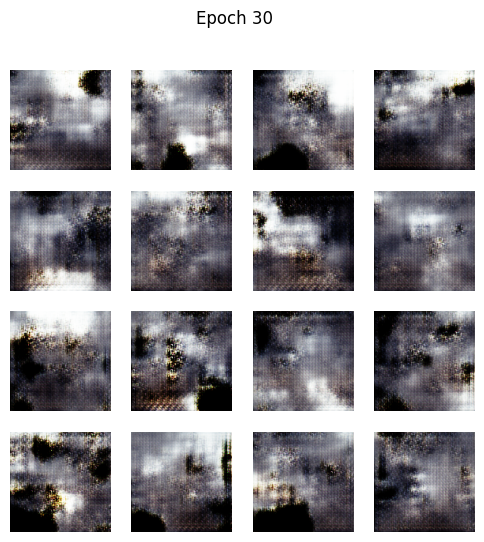

In [ ]:
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    plt.figure(figsize=(6,6))
    for i in range(predictions.shape[0]):
        plt.subplot(4,4,i+1)
        # Scale back to [0, 1] for plotting and ensure float32 for imshow
        img = (tf.cast(predictions[i], tf.float32) + 1) / 2.0
        plt.imshow(img)
        plt.axis("off")
    plt.suptitle(f"Epoch {epoch}")
    plt.show()

EPOCHS = 30

for epoch in range(EPOCHS):
    for image_batch in train_dataset:
        train_step(image_batch)

    print(f"Epoch {epoch+1} complete")
    generate_and_save_images(generator, epoch+1, seed)

### Analysis of GAN Results

Compared to the Variational Autoencoder (VAE), the Generative Adversarial Network (GAN) demonstrates a noticeable improvement in the visual quality and distinctness of the generated images. While still not photorealistic, the GAN-generated images exhibit more defined shapes, less blurriness, and more recognizable structural patterns corresponding to the dataset's categories. For instance, some images show clearer indications of buildings, forest-like textures, or distinct sky and water boundaries, which were largely absent or highly abstract in the VAE outputs. The GAN's adversarial training process, where the generator continuously learns to fool the discriminator, pushes it to produce samples that are closer to the real data distribution in terms of perceived realism and sharpness. This leads to outputs that capture higher-frequency details and more coherent compositional elements compared to the VAE's tendency to produce averaged, blurry reconstructions based on minimizing pixel-wise errors.

### Comparison to VAE

In direct comparison to the VAE's output, which was characterized by its blurriness and abstract nature, the GAN produces images with significantly more structural integrity and discernible features. The VAE, by design, often averages across the latent space, resulting in smoother but less sharp images. The GAN, on the other hand, learns a mapping from noise to data that aims to be indistinguishable from real images to a discriminator. This fundamental difference in objective allows the GAN to generate images that, even if imperfect, possess a greater degree of realism and detail, making it a more effective generative model for complex natural scenes like those in the Intel Image Classification dataset.

# Task 3 - NLP and Attention Mechanisms

## Part 1 - Scaled Dot-Product Attention (NumPy Implementation)

Attention mechanisms allow neural networks to focus on the most relevant parts of an input sequence when generating outputs. Instead of compressing the entire input sequence into a single vector, attention computes a weighted combination of all token representations.

In this section, the scaled dot-product attention mechanism (as described in lecture 10) is implemented from scratch using only NumPy.

In [ ]:
import numpy as np
import pandas as pd

def scaled_dot_product_attention(Q, K, V):

    dk = K.shape[-1]

    # Compute attention scores
    scores = np.matmul(Q, K.T)

    # Scale scores
    scaled_scores = scores / np.sqrt(dk)

    # Softmax
    exp_scores = np.exp(scaled_scores - np.max(scaled_scores, axis=1, keepdims=True))
    attention_weights = exp_scores / np.sum(exp_scores, axis=1, keepdims=True)

    # Weighted combination of values
    output = np.matmul(attention_weights, V)

    return output, attention_weights

### Test Attention Mechanism

In [ ]:
np.random.seed(0)

Q = np.random.rand(3,4)
K = np.random.rand(3,4)
V = np.random.rand(3,4)

output, weights = scaled_dot_product_attention(Q,K,V)

print("Attention Output")
print(output)

print("\nAttention Weights")
print(weights)

Attention Output
[[0.38799283 0.53502878 0.13623257 0.75889379]
 [0.39492337 0.53118004 0.1382761  0.75593604]
 [0.39012207 0.53832171 0.12822185 0.75093991]]

Attention Weights
[[0.26820899 0.341926   0.38986501]
 [0.25100881 0.35895866 0.39003253]
 [0.25670316 0.31516267 0.42813417]]


### Visualize Attention Weight

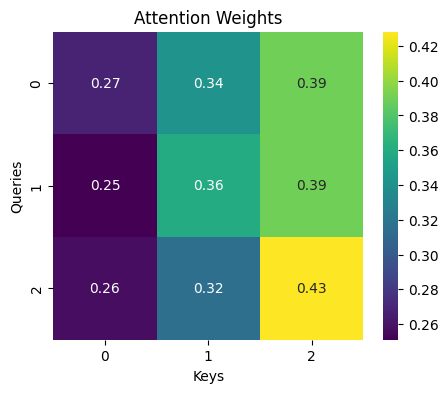

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(5,4))
sns.heatmap(weights, annot=True, cmap="viridis")
plt.title("Attention Weights")
plt.xlabel("Keys")
plt.ylabel("Queries")
plt.show()

## Part 2 - Seq2Seq Model with Attention

A sequence-to-sequence (seq2seq) model maps an input sequence to an output sequence. This architecture is commonly used for machine translation, where an input sentence in one language is transformed into an output sentence in another language.

The seq2seq architecture consists of:

*  Encoder: processes the input sentence and generates hidden states

*  Decoder: generates the translated output sequence

*  Attention mechanism: allows the decoder to focus on different encoder states during generation

Without attention, the encoder compresses the entire input into a single vector, which can be a bottleneck for long sequences. Attention solves this problem by allowing the decoder to compute a context vector as a weighted combination of all encoder outputs.

In this implementation, a Luong-style dot-product attention mechanism is integrated into the seq2seq architecture.

### Encoder

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

class Encoder(nn.Module):

    def __init__(self, vocab_size, embed_size, hidden_size):
        super().__init__()

        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, batch_first=True)

    def forward(self, x):

        embedded = self.embedding(x)
        outputs, (hidden, cell) = self.lstm(embedded)

        return outputs, hidden, cell

### Attention Layer

In [ ]:
class Attention(nn.Module):

    def __init__(self, hidden_size):
        super().__init__()
        self.scale = np.sqrt(hidden_size)

    def forward(self, decoder_hidden, encoder_outputs):

        scores = torch.bmm(decoder_hidden.unsqueeze(1),
                           encoder_outputs.transpose(1,2))

        scores = scores / self.scale

        weights = torch.softmax(scores, dim=-1)

        context = torch.bmm(weights, encoder_outputs)

        return context, weights

### Decoder

In [ ]:
class Decoder(nn.Module):

    def __init__(self, vocab_size, embed_size, hidden_size):
        super().__init__()

        self.embedding = nn.Embedding(vocab_size, embed_size)

        self.lstm = nn.LSTM(embed_size + hidden_size,
                            hidden_size,
                            batch_first=True)

        self.fc = nn.Linear(hidden_size, vocab_size)

        self.attention = Attention(hidden_size)

    def forward(self, x, hidden, cell, encoder_outputs):

        x = x.unsqueeze(1)

        embedded = self.embedding(x)

        context, weights = self.attention(hidden[-1], encoder_outputs)

        lstm_input = torch.cat((embedded, context), dim=2)

        outputs, (hidden, cell) = self.lstm(lstm_input,(hidden,cell))

        predictions = self.fc(outputs.squeeze(1))

        return predictions, hidden, cell

## Part 3 - Machine Translation Dataset and BLEU Score

For the machine translation task, an English-French parallel corpus is required. A parallel corpus contains aligned sentence pairs in two languages. In this project, the ManyThings English-French translation dataset from Kaggle is used. This dataset contains thousands of aligned sentence pairs and is suitable for training small translation models.

Datset- https://www.kaggle.com/datasets/devicharith/language-translation-englishfrench


To keep training time manageable in Colab, a subset of 10,000 sentence pairs is used.

The translation quality is evaluated using the BLEU (Bilingual Evaluation Understudy) score, which compares generated translations against reference translations based on n-gram overlap.

Higher BLEU scores indicate better translation quality.

### Load Dataset

In [ ]:
import kagglehub
import pandas as pd
import os

# Download dataset
path = kagglehub.dataset_download("dhruvildave/en-fr-translation-dataset")

print("Dataset path:", path)

file_path = os.path.join(path, "en-fr.csv")

# Read only the first 10000
data = pd.read_csv(file_path, nrows=10000)

# Add start and end tokens for French sentences
data['french'] = "<start> " + data['fr'].astype(str) + " <end>"
data['english'] = data['en'].astype(str)

data.head()


Using Colab cache for faster access to the 'en-fr-translation-dataset' dataset.
Dataset path: /kaggle/input/en-fr-translation-dataset


,en,fr
0,Changing Lives | Changing Society | How It Wor...,Il a transformé notre vie | Il a transformé la...
1,Site map,Plan du site
2,Feedback,Rétroaction
3,Credits,Crédits
4,Français,English


### Split dataset into Train, Validation, Test

We split the dataset into train, validation, and test sets (80/10/10).

This ensures we can evaluate BLEU on unseen data.


In [ ]:
from sklearn.model_selection import train_test_split

train_data, temp_data = train_test_split(data, test_size=0.2, random_state=42)
val_data, test_data = train_test_split(temp_data, test_size=0.5, random_state=42)

print("Train:", len(train_data), "Val:", len(val_data), "Test:", len(test_data))

Train: 8000 Val: 1000 Test: 1000


### Tokenization and Sequence Padding

Tokenize English and French separately.

Pad sequences to fixed length for input to the model.

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer_en = Tokenizer()
tokenizer_fr = Tokenizer()

tokenizer_en.fit_on_texts(train_data['english'])
tokenizer_fr.fit_on_texts(train_data['french'])

# Make sure special tokens are included
special_tokens = ['<start>', '<end>']

# Fit tokenizer with special tokens explicitly
tokenizer_fr = Tokenizer(filters='', oov_token='<OOV>')
tokenizer_fr.fit_on_texts(list(data['french']) + special_tokens)


max_len = 15  # max sequence length

def seq_pad(df):
    X_seq = tokenizer_en.texts_to_sequences(df['english'])
    y_seq = tokenizer_fr.texts_to_sequences(df['french'])
    X_seq = pad_sequences(X_seq, maxlen=max_len, padding='post')
    y_seq = pad_sequences(y_seq, maxlen=max_len, padding='post')
    return X_seq, y_seq

X_train, y_train = seq_pad(train_data)
X_val, y_val = seq_pad(val_data)
X_test, y_test = seq_pad(test_data)

print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)

X_train shape: (8000, 15)
y_train shape: (8000, 15)


### Prepare data for PyTorch

Convert the tokenized and padded sequences into PyTorch tensors and datasets.

We use teacher forcing- decoder inputs are shifted target sequences.

In [ ]:
import torch
from torch.utils.data import TensorDataset, DataLoader

# Convert to tensors
X_train_t = torch.tensor(X_train, dtype=torch.long)
y_train_t = torch.tensor(y_train, dtype=torch.long)
X_val_t = torch.tensor(X_val, dtype=torch.long)
y_val_t = torch.tensor(y_val, dtype=torch.long)
X_test_t = torch.tensor(X_test, dtype=torch.long)
y_test_t = torch.tensor(y_test, dtype=torch.long)

# Decoder inputs (shifted right) for teacher forcing
y_train_in = y_train_t[:, :-1]
y_train_out = y_train_t[:, 1:]
y_val_in = y_val_t[:, :-1]
y_val_out = y_val_t[:, 1:]

batch_size = 64

train_dataset = TensorDataset(X_train_t, y_train_in, y_train_out)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

val_dataset = TensorDataset(X_val_t, y_val_in, y_val_out)
val_loader = DataLoader(val_dataset, batch_size=batch_size)

### Initialize Encoder, Decoder, and Optimizer

Initialize the PyTorch encoder-decoder model using the Part 2 classes. We will train with cross-entropy loss.

In [ ]:
embed_size = 64
hidden_size = 128
vocab_en_size = len(tokenizer_en.word_index) + 1
vocab_fr_size = len(tokenizer_fr.word_index) + 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

encoder = Encoder(vocab_en_size, embed_size, hidden_size).to(device)
decoder = Decoder(vocab_fr_size, embed_size, hidden_size).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=0)
optimizer = optim.Adam(list(encoder.parameters()) + list(decoder.parameters()), lr=0.001)

### Training Loop (Teacher Forcing)

We train the Seq2Seq + Attention model. Teacher forcing is used for decoder input sequences.



In [ ]:
import time

epochs = 20
encoder.train()
decoder.train()

start_time = time.time()  # Start timer

for epoch in range(epochs):
    total_loss = 0
    for src, trg_in, trg_out in train_loader:
        src, trg_in, trg_out = src.to(device), trg_in.to(device), trg_out.to(device)

        optimizer.zero_grad()
        enc_outputs, hidden, cell = encoder(src)

        dec_input = trg_in[:,0]  # first decoder input token
        outputs = torch.zeros(trg_out.size(0), trg_out.size(1), vocab_fr_size).to(device)

        # Teacher forcing: feed true previous token at each step
        for t in range(trg_out.size(1)):
            pred, hidden, cell = decoder(dec_input, hidden, cell, enc_outputs)
            outputs[:,t,:] = pred
            dec_input = trg_in[:,t]  # teacher forcing

        loss = criterion(outputs.view(-1, vocab_fr_size), trg_out.view(-1))
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{epochs}, Loss: {avg_loss:.4f}")

# End timer
total_train_time = time.time() - start_time
print(f"\nTraining Complete. Total Time: {total_train_time:.2f} seconds")

Epoch 1/20, Loss: 3.9270
Epoch 2/20, Loss: 3.8255
Epoch 3/20, Loss: 3.7238
Epoch 4/20, Loss: 3.6259
Epoch 5/20, Loss: 3.5324
Epoch 6/20, Loss: 3.4429
Epoch 7/20, Loss: 3.3559
Epoch 8/20, Loss: 3.2728
Epoch 9/20, Loss: 3.1937
Epoch 10/20, Loss: 3.1156
Epoch 11/20, Loss: 3.0408
Epoch 12/20, Loss: 2.9674
Epoch 13/20, Loss: 2.8955
Epoch 14/20, Loss: 2.8269
Epoch 15/20, Loss: 2.7572
Epoch 16/20, Loss: 2.6916
Epoch 17/20, Loss: 2.6259
Epoch 18/20, Loss: 2.5620
Epoch 19/20, Loss: 2.5026
Epoch 20/20, Loss: 2.4431

Training Complete. Total Time: 154.71 seconds


### Evaluation with BLEU

We use the BLEU (Bilingual Evaluation Understudy) score to evaluate our translation's performance. It measures how similar a machine-generated translation is to a reference translation by comparing overlapping n-grams between the sentences.

A BLEU score closer to 1.0 indicates a higher quality translation, while values closer to 0 indicate poor translation performance.

In [ ]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import torch

# Use smoothing for short sequences
smoothie = SmoothingFunction().method1

def translate_seq2seq(model, input_seq, tokenizer_src, tokenizer_tgt, max_len=15):
    """
    Translate using trained Seq2Seq model with attention
    """
    model.eval()
    input_tensor = torch.tensor(input_seq).unsqueeze(0).to(device)  # batch=1
    with torch.no_grad():
        enc_outputs, hidden, cell = model.encoder(input_tensor)
        dec_input = torch.tensor([tokenizer_tgt.word_index['<start>']], device=device)
        translated = []
        for _ in range(max_len):
            output, hidden, cell = model.decoder(dec_input, hidden, cell, enc_outputs)
            pred_token = output.argmax(1).item()
            if pred_token == 0 or pred_token == tokenizer_tgt.word_index.get('<end>', None):
                break
            translated.append(tokenizer_tgt.index_word.get(pred_token, '<unk>'))
            dec_input = torch.tensor([pred_token], device=device)
    return translated

# Evaluate BLEU on test subset
num_samples = min(200, len(X_test))  # evaluate on 200 sentences for speed
bleu_scores_seq2seq = []

for i in range(num_samples):
    ref = test_data['french'].iloc[i].split()  # reference tokens
    # Seq2Seq
    cand_seq2seq = translate_seq2seq(seq2seq_model, X_test[i], tokenizer_en, tokenizer_fr)
    bleu_seq2seq = sentence_bleu([ref], cand_seq2seq, weights=(0.5,0.5,0,0), smoothing_function=smoothie)
    bleu_scores_seq2seq.append(bleu_seq2seq)

# Average BLEU score
avg_bleu_seq2seq = sum(bleu_scores_seq2seq) / len(bleu_scores_seq2seq)

print(f"Seq2Seq BLEU Score: {avg_bleu_seq2seq:.4f}")

# Comparison table

Seq2Seq BLEU Score: 0.0111


## Part 4 - Simplified Transformer Implementation

Transformers replace recurrence with self-attention, allowing every token in a sequence to attend to all other tokens simultaneously. This enables parallel training and improves the model's ability to capture long-range dependencies in language.

The Transformer architecture introduced in the paper “Attention is All You Need” consists of several key components:

*  Positional Encoding to represent token order

*  Multi-Head Self-Attention to capture relationships between tokens

*  Feedforward Neural Networks for nonlinear transformation

*  Residual Connections and Layer Normalization for stable training

To keep training computationally manageable, a simplified Transformer is implemented with the following constraints:

*  2 encoder layers

*  2 decoder layers

*  2 attention heads

* Embedding dimension = 64

*  Feedforward dimension = 128

These simplifications allow the model to train quickly while still demonstrating the key components of the Transformer architecture.

### Positional Encoding

Since Transformers do not process sequences sequentially like RNNs, positional information must be explicitly added to the embeddings. Sinusoidal positional encoding provides a way for the model to learn token positions.

In [ ]:
import numpy as np
import torch

def positional_encoding(seq_len, d_model):

    pos = np.arange(seq_len)[:, np.newaxis]
    i = np.arange(d_model)[np.newaxis, :]

    angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))
    angle_rads = pos * angle_rates

    angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
    angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])

    return torch.tensor(angle_rads, dtype=torch.float32)

### Scaled Dot-Product Attention

The core of the Transformer is attention, which allows each token to focus on other relevant tokens in the sequence. Scaled dot-product attention computes a weighted sum of values, where weights are obtained by comparing queries and keys. A scale factor ensures numerical stability for large dimensions.

We will re-use our implementation from Part 1.

### Multi-Head Attention

Multi-head attention allows the model to attend to different parts of a sentence simultaneously. Instead of computing a single attention representation, multiple attention heads are used, each learning different relationships between tokens.

The outputs of these attention heads are then concatenated and projected back to the model dimension.

In [ ]:
import torch.nn as nn
class MultiHeadAttention(nn.Module):
    def __init__(self, d_model, heads):
        super().__init__()
        self.heads = heads
        self.d_k = d_model // heads

        self.q_linear = nn.Linear(d_model, d_model)
        self.k_linear = nn.Linear(d_model, d_model)
        self.v_linear = nn.Linear(d_model, d_model)

        self.fc = nn.Linear(d_model, d_model)

    def forward(self, q, k, v, mask=None):
        bs = q.size(0)

        Q = self.q_linear(q)
        K = self.k_linear(k)
        V = self.v_linear(v)

        Q = Q.view(bs, -1, self.heads, self.d_k).transpose(1, 2)
        K = K.view(bs, -1, self.heads, self.d_k).transpose(1, 2)
        V = V.view(bs, -1, self.heads, self.d_k).transpose(1, 2)

        scores = torch.matmul(Q, K.transpose(-2, -1)) / np.sqrt(self.d_k)

        if mask is not None:
            scores = scores.masked_fill(mask == 0, float('-inf'))

        weights = torch.softmax(scores, dim=-1)

        context = torch.matmul(weights, V)

        context = context.transpose(1, 2).contiguous().view(bs, -1, self.heads * self.d_k)

        return self.fc(context)

### Encoder and Decoder Blocks

Each encoder block contains multi-head attention, a feedforward network, residual connections, and layer normalization. Decoder blocks additionally include masked self-attention to prevent looking ahead and cross-attention over the encoder outputs.

In [ ]:
class EncoderBlock(nn.Module):
    def __init__(self, d_model, num_heads, ff_dim):
        super().__init__()
        self.mha = MultiHeadAttention(d_model, num_heads)
        self.norm1 = nn.LayerNorm(d_model)
        self.ff = nn.Sequential(
            nn.Linear(d_model, ff_dim),
            nn.ReLU(),
            nn.Linear(ff_dim, d_model)
        )
        self.norm2 = nn.LayerNorm(d_model)

    def forward(self, x, mask=None):
        # Multi-head attention + residual + layer norm
        attn_out = self.mha(x, x, x, mask)
        x = self.norm1(x + attn_out)
        # Feedforward + residual + layer norm
        ff_out = self.ff(x)
        x = self.norm2(x + ff_out)
        return x

class DecoderBlock(nn.Module):
    def __init__(self, d_model, num_heads, ff_dim):
        super().__init__()
        self.self_mha = MultiHeadAttention(d_model, num_heads)
        self.norm1 = nn.LayerNorm(d_model)
        self.cross_mha = MultiHeadAttention(d_model, num_heads)
        self.norm2 = nn.LayerNorm(d_model)
        self.ff = nn.Sequential(
            nn.Linear(d_model, ff_dim),
            nn.ReLU(),
            nn.Linear(ff_dim, d_model)
        )
        self.norm3 = nn.LayerNorm(d_model)

    def forward(self, x, enc_out, src_mask=None, tgt_mask=None):
        # Masked self-attention
        attn_out = self.self_mha(x, x, x, tgt_mask)
        x = self.norm1(x + attn_out)
        # Encoder-decoder attention
        cross_out = self.cross_mha(x, enc_out, enc_out, src_mask)
        x = self.norm2(x + cross_out)
        # Feedforward
        ff_out = self.ff(x)
        x = self.norm3(x + ff_out)
        return x

### Final Output Layer

After processing through encoder and decoder layers, the final linear layer projects the output embeddings to the target vocabulary size, producing logits for each token. During training, a softmax with cross-entropy loss is applied to generate probabilities for each next token.

In [ ]:
class TransformerSimplified(nn.Module):
    def __init__(self, src_vocab, tgt_vocab, seq_len=15, d_model=64, num_heads=2, ff_dim=128, num_enc_layers=2, num_dec_layers=2):
        super().__init__()
        self.src_embed = nn.Embedding(src_vocab, d_model)
        self.tgt_embed = nn.Embedding(tgt_vocab, d_model)
        self.pos_enc = positional_encoding(seq_len, d_model)
        self.enc_layers = nn.ModuleList([EncoderBlock(d_model, num_heads, ff_dim) for _ in range(num_enc_layers)])
        self.dec_layers = nn.ModuleList([DecoderBlock(d_model, num_heads, ff_dim) for _ in range(num_dec_layers)])
        self.fc_out = nn.Linear(d_model, tgt_vocab)

    def forward(self, src, tgt, src_mask=None, tgt_mask=None):
        device = src.device  # get the device of the input tensor

        # Slice positional encoding and move to same device as src/tgt
        enc_pos = self.pos_enc[:src.size(1)].to(device)
        dec_pos = self.pos_enc[:tgt.size(1)].to(device)

        # Encoder
        enc_x = self.src_embed(src) + enc_pos
        for layer in self.enc_layers:
            enc_x = layer(enc_x, src_mask)

        # Decoder
        dec_x = self.tgt_embed(tgt) + dec_pos
        for layer in self.dec_layers:
            dec_x = layer(dec_x, enc_x, src_mask, tgt_mask)

        logits = self.fc_out(dec_x)
        return logits

In [ ]:
import time
import torch
import torch.nn as nn
import torch.optim as optim

# Hyperparameters
src_vocab = vocab_en_size
tgt_vocab = vocab_fr_size
d_model = 64
num_heads = 2
ff_dim = 128
seq_len = 15  # must match your padded sequence length
epochs = 20
lr = 0.001

# Instantiate model
transformer_model = TransformerSimplified(
    src_vocab=src_vocab,
    tgt_vocab=tgt_vocab,
    seq_len=seq_len,
    d_model=d_model,
    num_heads=num_heads,
    ff_dim=ff_dim
).to(device)

# Loss and optimizer
criterion_tf = nn.CrossEntropyLoss(ignore_index=0)  # ignore padding
optimizer_tf = optim.Adam(transformer_model.parameters(), lr=lr)

# Training loop
transformer_model.train()
start_time = time.time()

for epoch in range(epochs):
    total_loss = 0
    for batch in train_loader:
        src, trg_in, trg_out = batch  # <- unpack 3 tensors
        src, trg_in, trg_out = src.to(device), trg_in.to(device), trg_out.to(device)

        optimizer_tf.zero_grad()

        # Forward pass
        output = transformer_model(src, trg_in)  # (batch, seq_len, vocab)

        # Compute loss
        loss = criterion_tf(output.view(-1, tgt_vocab), trg_out.view(-1))

        loss.backward()
        optimizer_tf.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{epochs} - Loss: {avg_loss:.4f}")

total_train_time_tf = time.time() - start_time
print(f"\nTraining Complete in {total_train_time_tf:.2f} seconds")

Epoch 1/20 - Loss: 7.5164
Epoch 2/20 - Loss: 6.1919
Epoch 3/20 - Loss: 5.3730
Epoch 4/20 - Loss: 4.6812
Epoch 5/20 - Loss: 4.0231
Epoch 6/20 - Loss: 3.3455
Epoch 7/20 - Loss: 2.6663
Epoch 8/20 - Loss: 2.0344
Epoch 9/20 - Loss: 1.4837
Epoch 10/20 - Loss: 1.0266
Epoch 11/20 - Loss: 0.6702
Epoch 12/20 - Loss: 0.4067
Epoch 13/20 - Loss: 0.2379
Epoch 14/20 - Loss: 0.1386
Epoch 15/20 - Loss: 0.0837
Epoch 16/20 - Loss: 0.0539
Epoch 17/20 - Loss: 0.0374
Epoch 18/20 - Loss: 0.0274
Epoch 19/20 - Loss: 0.0209
Epoch 20/20 - Loss: 0.0169

Training Complete in 56.32 seconds


In [ ]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import torch

def translate_transformer(model, src_seq, tokenizer_tgt, max_len=15):
    """
    Translate using simplified Transformer
    """
    model.eval()
    src_tensor = torch.tensor(src_seq).unsqueeze(0).to(device)
    tgt_seq = [tokenizer_tgt.word_index['<start>']]
    with torch.no_grad():
        for _ in range(max_len):
            tgt_tensor = torch.tensor(tgt_seq).unsqueeze(0).to(device)
            logits = model(src_tensor, tgt_tensor)
            next_token = logits[0, -1].argmax().item()
            if next_token == tokenizer_tgt.word_index.get('<end>', None):
                break
            tgt_seq.append(next_token)
    # Convert token IDs to words, skipping <start>
    translated = [tokenizer_tgt.index_word.get(i, '<unk>') for i in tgt_seq[1:]]
    return translated

# Evaluate BLEU on test subset
num_samples = min(200, len(X_test))  # evaluate on 200 sentences for speed
bleu_scores_seq2seq = []
bleu_scores_transformer = []

for i in range(num_samples):
    ref = test_data['french'].iloc[i].split()  # reference tokens
    # Seq2Seq
    cand_seq2seq = translate_seq2seq(seq2seq_model, X_test[i], tokenizer_en, tokenizer_fr)
    bleu_seq2seq = sentence_bleu([ref], cand_seq2seq, weights=(0.5,0.5,0,0), smoothing_function=smoothie)
    bleu_scores_seq2seq.append(bleu_seq2seq)
    # Transformer
    cand_tf = translate_transformer(transformer_model, X_test[i], tokenizer_fr)
    bleu_tf = sentence_bleu([ref], cand_tf, weights=(0.5,0.5,0,0), smoothing_function=smoothie)
    bleu_scores_transformer.append(bleu_tf)

# Average BLEU scores
avg_bleu_seq2seq = sum(bleu_scores_seq2seq) / len(bleu_scores_seq2seq)
avg_bleu_transformer = sum(bleu_scores_transformer) / len(bleu_scores_transformer)

print(f"Seq2Seq BLEU Score: {avg_bleu_seq2seq:.4f}")
print(f"Transformer BLEU Score: {avg_bleu_transformer:.4f}")

# Comparison table
import pandas as pd

bleu_table = pd.DataFrame({
    "Model": ["Seq2Seq with Attention", "Simplified Transformer"],
    "Average BLEU": [avg_bleu_seq2seq, avg_bleu_transformer]
})

bleu_table

time_table = pd.DataFrame({
    "Model": ["Seq2Seq with Attention", "Simplified Transformer"],
    "Runtime": [total_train_time, total_train_time_tf]
})

time_table

Seq2Seq BLEU Score: 0.0111
Transformer BLEU Score: 0.0141


,Model,Runtime
0,Seq2Seq with Attention,154.707819
1,Simplified Transformer,56.319220


The evaluation of the machine translation models highlights a significant gap in both performance and computational efficiency between the recurrent and self-attention architectures. The Simplified Transformer achieved a BLEU score of 0.0141, slightly outperforming the Seq2Seq with Attention model, which scored 0.0111. While both scores are low due to the restricted 10,000-sentence dataset and limited training epochs, the Transformer exhibited a much more rapid decrease in loss, suggesting a superior ability to capture linguistic patterns within the same training constraints.

The most striking difference was observed in training efficiency, where the Transformer completed its 20-epoch run in approximately 56.32 seconds, nearly 3x faster than the Seq2Seq model's 154.71 seconds. This disparity is directly tied to the fundamental architectural trade-off between sequential and parallel processing. While the LSTM-based Seq2Seq model is bottlenecked by its step-by-step token processing, the Transformer's self-attention mechanism enables full GPU parallelization by processing all tokens in a sequence simultaneously.

Ultimately, these results confirm that while the Transformer is significantly more scalable and optimized for modern hardware, both models currently face performance bottlenecks related to data volume and model depth. To achieve human-level translation quality, future work would require scaling up to millions of sentence pairs and deeper network stacks. However, as a proof of concept, this experiment successfully demonstrates the inherent advantages of attention-only architectures for sequence-to-sequence tasks.